In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt

Downloading first 2000 images from database

In [2]:
from sklearn.datasets import fetch_openml
mnist = fetch_openml('mnist_784',version=1)
X = mnist["data"]

In [3]:
print(X.shape)

(70000, 784)


In [4]:
data = X[:2000,:]
print(data.shape)
no_clusters = 10
no_initialize = 15

(2000, 784)


K-Means Algorithm

In [5]:
def k_means(data,no_clusters,no_initialize):
    
    #INITALIZING LISTS FOR OUR RETURN VALUE
    final_MSEs = []
    final_clusters = []
    final_centers = []
    losses = []
    final_losses = []
    
    for iteration in range(no_initialize):
        centers = []
        
        #INITIALIZING 10 RANDOM CENTERS
        for i in range(no_clusters):
            random_num = random.randint(0,1999)
            centers.append(data[random_num])
        
        same_center = 0
        loss = []
        while same_center < 10:
            # CLUSTER MEMBERSHIP: calculating the distance from each instance to the K center and assigning 
            # the instances to the closest center
            clusters = {c: [] for c in range(10)}
            for Xi in data:
                min_dist = float("inf")
                for index in range(10):
                    distance = np.linalg.norm(Xi - centers[index])
                    if distance < min_dist:
                        closest_idx = index
                        min_dist = distance
                clusters[closest_idx].append(Xi)
            
            # RECALCULATING MEANS FOR EACH CLUSTER: for all the data points in each cluster, compute the mean
            # and that mean becomes the new center
            old_centers = []
            old_centers = centers
            centers = []
            for i in clusters:
                new_center = np.zeros((1,784))
                for instance in clusters[i]:
                    new_center += instance
                new_center = [x/len(clusters[i]) for x in new_center]
                if len(clusters[i]) == 1:
                    centers.append(old_centers[i])
                else:    
                    centers.append(new_center)
            
            # CALCULATING MSE VALUES FOR EACH INSTANCE: calculating the sum of the euclidean distances of 
            # each data point with its corresponding center and then divide by the number of samples
            euclidean_dist = 0
            MSE = 0
            for i in clusters:
                for instance in clusters[i]:
                    euclidean_dist += (np.linalg.norm(instance - centers[i]))**2
            MSE = euclidean_dist/len(data)        
            
            loss.append(MSE)
            
            # CHECKING FOR CONVERGENCE: converges if all the old centers are the same as the new centers
            same_center = 0
            for i in range(len(old_centers)):
                if np.array_equal(old_centers[i],centers[i]) == True:
                    same_center += 1    
            if same_center == 10:
                break
        
        # appending values for our return value
        final_MSEs.append(MSE)
        final_centers.append(centers)
        final_clusters.append(clusters)
        losses.append(loss)
        final_losses.append(loss[-1])
        
        #plotting the MSE values for each iteration
        #plt.plot(loss)
        #plt.title("Iteration: {}".format(iteration+1))
        #plt.xlabel("K-value")
        #plt.ylabel("Loss")
        #plt.show()
    
    #plotting the smallest MSE for each iteration
    x = []
    for iteration in range(15):
        x.append(iteration)
    plt.plot(x, final_MSEs)    
    plt.title("MSE Values over M Iterations")
    plt.xlabel("Iteration")
    plt.ylabel("MSE")
    plt.show()
    
    #finding the center, clusters for the minimum MSE
    min_index = final_losses.index(min(final_losses))
    optimal_val = [final_centers[min_index], final_clusters[min_index],losses[min_index], final_losses]
    
    #plotting the MSE values for the iteration with the lowest MSE
    plt.plot(losses[min_index])
    plt.title("MSE Values for the Iteration with the Lowest MSE")
    plt.xlabel("K-value")
    plt.ylabel("Loss")
    plt.show()
    return optimal_val 

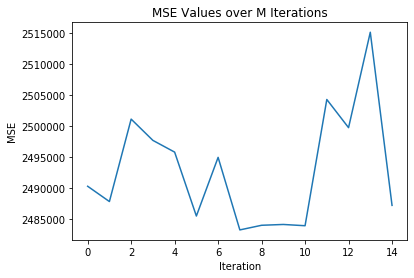

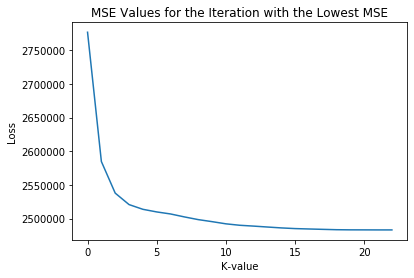

In [6]:
values = []
values = k_means(data,no_clusters,15)

In [7]:
print("Best K centers:\n", values[0])

Best K centers:
 [[array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.0

In [8]:
print("Best cluster assignments:\n", values[1])

Best cluster assignments:
 {0: [array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,  42., 118., 219., 166., 118., 118.,   6.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0., 

In [9]:
print("All loss values of the best k-means iteration:\n", values[2])
print("\nFinal losses of all N iterations:\n", values[3])

All loss values of the best k-means iteration:
 [2776481.752470305, 2584725.621722432, 2537864.558845728, 2520867.1408108347, 2513860.3425552165, 2509970.3420988466, 2506950.22852893, 2502581.383146927, 2498570.9751118207, 2495561.741097775, 2492318.8534605107, 2490182.515617443, 2488950.537747239, 2487591.67055189, 2486273.7214642595, 2485267.8412108985, 2484679.0146460286, 2484131.3035410517, 2483606.3553868164, 2483393.319472869, 2483352.08113179, 2483293.528426846, 2483293.528426846]

Final losses of all N iterations:
 [2490318.77131417, 2487860.044574096, 2501126.0979024647, 2497701.4252291205, 2495813.795522107, 2485529.1526518557, 2494969.5577405686, 2483293.528426846, 2484040.1257295217, 2484171.288569373, 2483967.4341551894, 2504282.1658671317, 2499750.486560064, 2515104.844994322, 2487244.005190981]
